# Assignment 3

You only need to write one line of code for each question. When answering questions that ask you to identify or interpret something, the length of your response doesn’t matter. For example, if the answer is just ‘yes,’ ‘no,’ or a number, you can just give that answer without adding anything else.

We will go through comparable code and concepts in the live learning session. If you run into trouble, start by using the help `help()` function in Python, to get information about the datasets and function in question. The internet is also a great resource when coding (though note that **no outside searches are required by the assignment!**). If you do incorporate code from the internet, please cite the source within your code (providing a URL is sufficient).

Please bring questions that you cannot work out on your own to office hours, work periods or share with your peers on Slack. We will work with you through the issue.

### Clustering and Resampling

Let's set up our workspace and use the **Wine dataset** from `scikit-learn`. This dataset is a classic dataset used for clustering tasks. It consists of many samples of wine. Here are the key features and characteristics of the dataset:

##### Features (13 chemical properties):
1. Alcohol: The percentage of alcohol in the wine.
2. Malic acid: A type of acid found in grapes, contributing to wine’s tartness.
3. Ash: The total amount of non-volatile substances left after burning the wine
4. Alcalinity of ash: Measures the alkalinity of the ash component of wine.
5. Magnesium: The amount of magnesium in the wine (measured in mg/L).
6. Total phenols: Represents the total amount of phenolic compounds in wine.
7. Flavanoids: A type of phenolic compound responsible for bitterness and astringency.
8. Nonflavanoid phenols: Phenolic compounds that are not flavonoids.
9. Proanthocyanins: A type of tannin that affects astringency and bitterness.
10. Color intensity: Measures the depth or intensity of the wine’s color. 
11. Hue: The shade of color in the wine (ratio of red to yellow tones).
12. OD280/OD315 of diluted wines: Measures the wine’s absorbance at 280 nm and 315 nm, indicating phenol concentration.
13. Proline: An amino acid found in wine, often associated with aging potential and quality.

In [2]:
# Import standard libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans


#### **Question 1:** 
#### Data inspection

#### Load the Wine dataset:

Use scikit-learn to load the Wine dataset and convert it into a Pandas DataFrame.
Display the first few rows of the dataset. How many observations (rows) and features (columns) does the dataset contain?

In [7]:
from sklearn.datasets import load_wine
# Load the Wine dataset
wine_data = load_wine()

# Convert to DataFrame
wine_df = pd.DataFrame(wine_data.data, columns=wine_data.feature_names)

# Display the DataFrame first 5 rows
print(wine_df.head(5))

# Display number of rows and columns
print(f"Number of rows: {wine_df.shape[0]}, Number of columns: {wine_df.shape[1]}")

   alcohol  malic_acid   ash  alcalinity_of_ash  magnesium  total_phenols  \
0    14.23        1.71  2.43               15.6      127.0           2.80   
1    13.20        1.78  2.14               11.2      100.0           2.65   
2    13.16        2.36  2.67               18.6      101.0           2.80   
3    14.37        1.95  2.50               16.8      113.0           3.85   
4    13.24        2.59  2.87               21.0      118.0           2.80   

   flavanoids  nonflavanoid_phenols  proanthocyanins  color_intensity   hue  \
0        3.06                  0.28             2.29             5.64  1.04   
1        2.76                  0.26             1.28             4.38  1.05   
2        3.24                  0.30             2.81             5.68  1.03   
3        3.49                  0.24             2.18             7.80  0.86   
4        2.69                  0.39             1.82             4.32  1.04   

   od280/od315_of_diluted_wines  proline  
0                  

#### **Question 2:** 
#### Data-visualization

Let's create plots to visualize the relationships between the features (e.g., alcohol, malic acid, ash...).


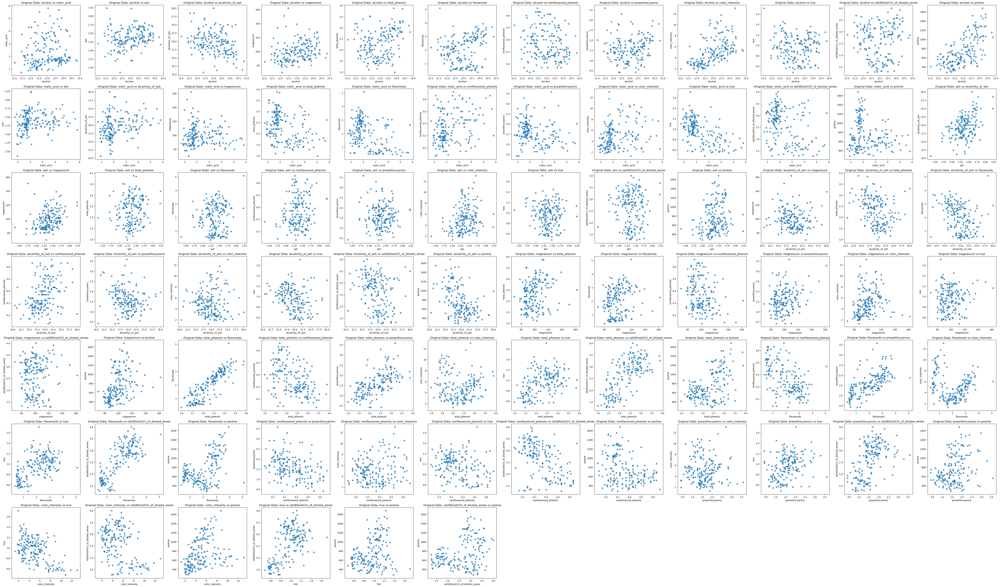

In [ ]:
def plot_feature_pairs(data, feature_names, color_labels=None, title_prefix=''):
    """
    Helper function to create scatter plots for all possible pairs of features.
    
    Parameters:
    - data: DataFrame containing the features to be plotted.
    - feature_names: List of feature names to be used in plotting.
    - color_labels: Optional. Cluster or class labels to color the scatter plots.
    - title_prefix: Optional. Prefix for plot titles to distinguish between different sets of plots.
    """
    # Create a figure for the scatter plots
    plt.figure(figsize=(60, 60))
    
    # Counter for subplot index
    plot_number = 1
    
    # Loop through each pair of features
    for i in range(len(feature_names)):
        for j in range(i + 1, len(feature_names)):
            plt.subplot(len(feature_names)-1, len(feature_names)-1, plot_number)
            
            # Scatter plot colored by labels if provided
            if color_labels is not None:
                plt.scatter(data[feature_names[i]], data[feature_names[j]], 
                            c=color_labels, cmap='viridis', alpha=0.7)
            else:
                plt.scatter(data[feature_names[i]], data[feature_names[j]], alpha=0.7)
            
            plt.xlabel(feature_names[i])
            plt.ylabel(feature_names[j])
            plt.title(f'{title_prefix}{feature_names[i]} vs {feature_names[j]}')
            
            # Increment the plot number
            plot_number += 1

    # Adjust layout to prevent overlap
    plt.tight_layout()

    # Show the plot
    plt.show()

# Get feature names
feature_names = wine_df.columns

# Use the helper function to plot scatter plots without coloring by cluster labels
plot_feature_pairs(wine_df, feature_names, title_prefix='Original Data: ')

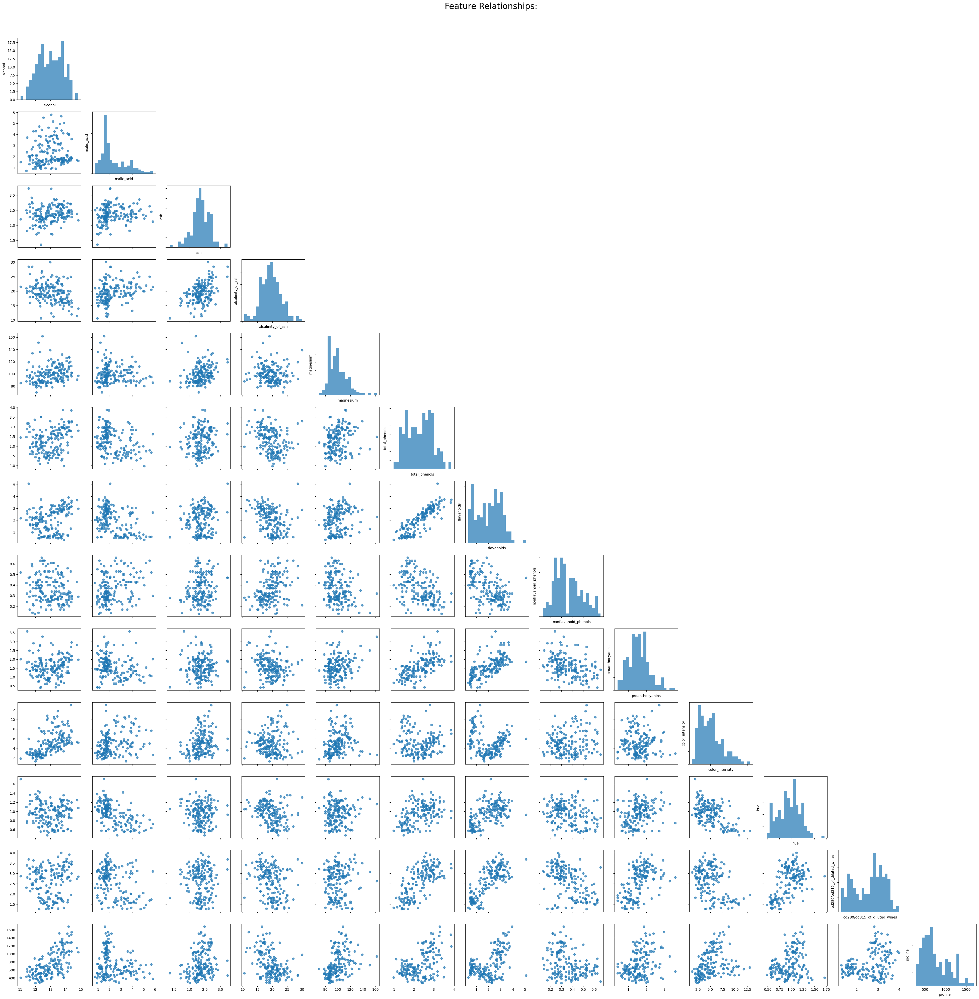

In [ ]:
# the scatter plots above were hard to interpret as it's hard to see which two features are being compared here
# another way to visualize the feature relationships is to create a grid of plots where:
# - the diagonal contains histograms of each feature
# - the lower triangle contains scatter plots for each unique pair of features
# - the upper triangle is left blank to avoid duplicate plots

def plot_feature_pairs_no_duplicates(data, feature_names, color_labels=None, title_prefix=''):
    
    n = len(feature_names)
    fig, axes = plt.subplots(n, n, figsize=(3*n, 3*n))
    fig.suptitle(title_prefix.strip(), fontsize=24, y=1.02)

    for i in range(n):
        for j in range(n):

            ax = axes[i, j]
            
            if i == j:
                # Diagonal: histogram
                ax.hist(data[feature_names[i]], bins=20, alpha=0.7)
                ax.set_ylabel(feature_names[i])
                ax.set_xlabel(feature_names[j])

            elif i > j:
                # Lower triangle: unique scatter plots only
                x = data[feature_names[j]]
                y = data[feature_names[i]]

                if color_labels is not None:
                    ax.scatter(x, y, c=color_labels, cmap='viridis', alpha=0.7)
                else:
                    ax.scatter(x, y, alpha=0.7)

            else:
                # Upper triangle: turn off (remove duplicates)
                ax.axis("off")

            # Reduce clutter
            if i < n-1:
                ax.set_xticklabels([])
            if j > 0:
                ax.set_yticklabels([])

    plt.tight_layout()
    plt.show()


# Feature names
feature_names = wine_df.columns

# Call the updated function
plot_feature_pairs_no_duplicates(wine_df, feature_names, title_prefix="Feature Relationships: ")

**Question:**
- Do you notice any patterns or relationships between the different features? How might these patterns help in distinguishing between different species?

> 1. Some features are strongly correlated and there are linear relationship between them, which means they tend to increase or decrease together
> 2. Most of the points are scattered out but in some plots, the dots show some initial clusters
> 3. The different species may be separated by these naturally formed clusters where they have similarly values to each other. 

#### **Question 3:** 
#### Data cleaning

In [11]:
# Initialize the StandardScaler
scaler = StandardScaler()

# Scale all the features in the dataset
scaled_features = scaler.fit_transform(wine_df)

# Create a new DataFrame with scaled features
scaled_wine_df = pd.DataFrame(scaled_features, columns=wine_data.feature_names)

# Display the first few rows of the scaled DataFrame
print(scaled_wine_df.head())

    alcohol  malic_acid       ash  alcalinity_of_ash  magnesium  \
0  1.518613   -0.562250  0.232053          -1.169593   1.913905   
1  0.246290   -0.499413 -0.827996          -2.490847   0.018145   
2  0.196879    0.021231  1.109334          -0.268738   0.088358   
3  1.691550   -0.346811  0.487926          -0.809251   0.930918   
4  0.295700    0.227694  1.840403           0.451946   1.281985   

   total_phenols  flavanoids  nonflavanoid_phenols  proanthocyanins  \
0       0.808997    1.034819             -0.659563         1.224884   
1       0.568648    0.733629             -0.820719        -0.544721   
2       0.808997    1.215533             -0.498407         2.135968   
3       2.491446    1.466525             -0.981875         1.032155   
4       0.808997    0.663351              0.226796         0.401404   

   color_intensity       hue  od280/od315_of_diluted_wines   proline  
0         0.251717  0.362177                      1.847920  1.013009  
1        -0.293321  0.406051

Why is it important to standardize the features of a dataset before applying clustering algorithms like K-Means? Discuss the implications of using unstandardized data in your analysis.

> Since K-means clustering is a distance-based algorithm, each value plays a role in the distance calculation. Without standardization, some features with large numeric ranges will naturally overpower and the clusters are formed mainly by those features and ignore the smaller-scale but potentially important features.  

#### **Question 4:** 
#### K-means clustering 

Apply the K-Means clustering algorithm to the Wine dataset. Choose the value 3 for the number of clusters (`k=3`) and fit the model. Assign cluster labels to the original data and add them as a new column in the DataFrame.

c:\Users\Charlotte\miniconda3\envs\dsi_participant\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


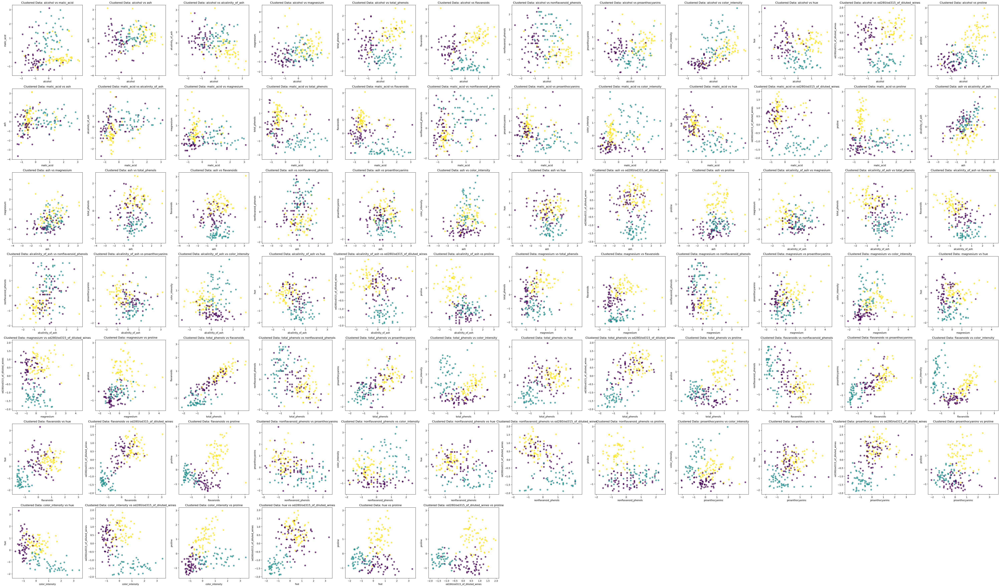

In [14]:
# Your answer...

# To avoid a common warning related to Kmeans on windows systems
import os
os.environ["OMP_NUM_THREADS"] = "1"

# K-means clustering with K=3
kmeans = KMeans(n_clusters=3, random_state=20251209)
clustered_wine_data = scaled_wine_df.copy()
clustered_wine_data['Cluster'] = kmeans.fit_predict(scaled_wine_df)

# Use the helper function to plot scatter plots, colored by cluster labels
plot_feature_pairs(clustered_wine_data, feature_names, color_labels=clustered_wine_data['Cluster'], title_prefix='Clustered Data: ')

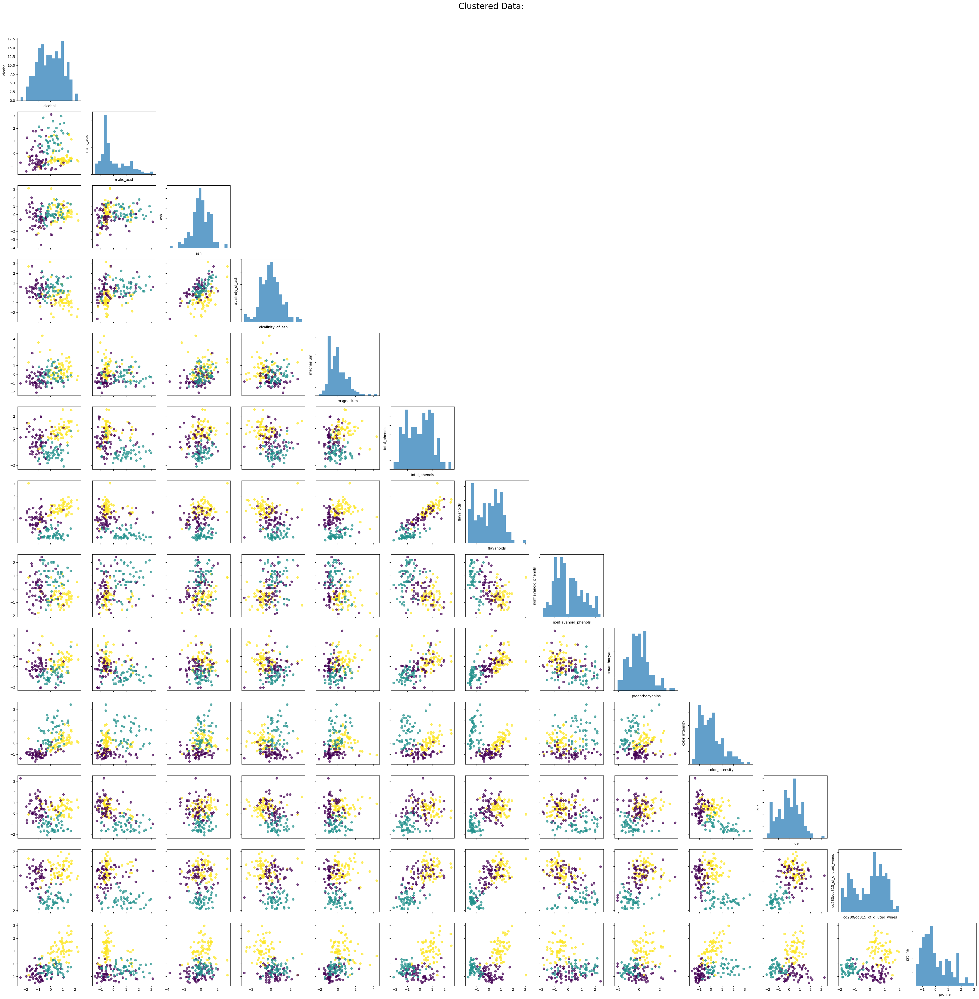

In [15]:
plot_feature_pairs_no_duplicates(clustered_wine_data, feature_names, color_labels=clustered_wine_data['Cluster'], title_prefix='Clustered Data: ')

We chose `k=3` for the number of clusters arbitrarily. However, in a real-world scenario, it is important to determine the optimal number of clusters using appropriate methods.

**Question**: What is one method commonly used to determine the optimal number of clusters in K-means clustering, and why is this method helpful?

> Elbow methods. This method determines the optimal k by looking for point where increasing k does not further increase within-cluster similarity. As k increases, the within-cluster sum of squared distances is supposed to decrease. However, after a certain point, they improvement becomes minimal. Elbow point is where this improvement changes the most sharpely.

> This method is helpful because it is a visualized, data-driven method to choose K. 

#### **Question 5:** 
#### Bootstrapping 

Implement bootstrapping on the mean of `color intensity`. Generate 10000 bootstrap samples, calculate the mean for each sample, and compute a 90% confidence interval.

In [19]:
# Your answer here...

# bootstrapping on color_intensity. B = 10000. 
mean_color_intensity = wine_df['color_intensity'].mean()
B = 10000
bootstrap_means = []
n = len(wine_df)
for _ in range(B):
    sample = wine_df['color_intensity'].sample(n, replace=True)
    bootstrap_means.append(sample.mean())
# Calculate 90% confidence interval
alpha = 0.10
lower_bound = np.percentile(bootstrap_means, 100 * (alpha / 2))
upper_bound = np.percentile(bootstrap_means, 100 * (1 - alpha / 2))

np.random.seed(123)

# Display the result
print(f"Mean of Color Intensity: {mean_color_intensity}")
print(f"bootstrap_means: {bootstrap_means[:5]}")  # Display first 5 bootstrap means for verification
print(f"90% Confidence Interval of Mean Color Intensity: ({lower_bound}, {upper_bound})")

Mean of Color Intensity: 5.058089882022472
bootstrap_means: [np.float64(5.112584269662921), np.float64(4.935955056179775), np.float64(4.991067410112359), np.float64(5.009438202247191), np.float64(5.0891573033707855)]
90% Confidence Interval of Mean Color Intensity: (4.778817409550562, 5.345019657303371)


**Question:**
- Why do we use bootstrapping in this context? What does it help us understand about the mean?

>  Bootstrapping can give us contexts when we want to collect new color intensity data again. By re-sampling within the same dataset, it is simulating the process of collecting new data. The bootstrapped means and confidence interval represent the uncertainty and stability of the mean value. 

**Question:**
- What is the purpose of calculating the confidence interval from the bootstrap samples? How does it help us interpret the variability of the estimate?

> The confidence interval quantifies the uncertainty by showing how the mean would vary across samples. Narrower intervals indicate a stable estimate while wide intervals means uncertainty about the true population mean. 

**Question:**

- Reflect on the variability observed in the bootstrapped means and discuss whether the mean of the color intensity appears to be a stable and reliable estimate based on the confidence interval and the spread of the bootstrapped means.

In [21]:
# calculate margin of error
std_error = np.std(bootstrap_means)
margin_of_error = std_error * 1.645  # for 90% confidence interval

# calculate relative margin of error
relative_margin_of_error = margin_of_error / mean_color_intensity
print(f"Relative Margin of Error: {relative_margin_of_error}")

Relative Margin of Error: 0.05623799210196444


> The mean of colour intensity appears to be a stable mean and reliable estimate of the true population mean because it is a relatively narrow interval. The relative margin of error is ~5.6% which means that the estimate would not deviate from true population mean by over 5.6%. This indicates a relatively precise estimate too. 

# Criteria


| **Criteria**                                           | **Complete**                                      | **Incomplete**                                    |
|--------------------------------------------------------|---------------------------------------------------|--------------------------------------------------|
| **Data Inspection**                                    | Data is thoroughly inspected for the number of variables, observations, and data types, and relevant insights are noted. | Data inspection is missing or lacks detail.         |
| **Data Visualization**                                 | Visualizations (e.g., scatter plots) are correctly interpreted to explore relationships between features and species. | Visualizations are not correctly interpreted. |
| **Clustering Implementation**                           | K-Means clustering is correctly implemented, and cluster labels are appropriately assigned to the dataset.            | K-Means clustering is missing or incorrectly implemented. |
| **Bootstrapping Process**                              | Bootstrapping is correctly performed, and results are used to assess variable mean stability. | Bootstrapping is missing or incorrectly performed. |

## Submission Information

🚨 **Please review our [Assignment Submission Guide](https://github.com/UofT-DSI/onboarding/blob/main/onboarding_documents/submissions.md)** 🚨 for detailed instructions on how to format, branch, and submit your work. Following these guidelines is crucial for your submissions to be evaluated correctly.

### Note:

If you like, you may collaborate with others in the cohort. If you choose to do so, please indicate with whom you have worked with in your pull request by tagging their GitHub username. Separate submissions are required.

### Submission Parameters:
* Submission Due Date: `11:59 PM - 12/10/2025`
* The branch name for your repo should be: `assignment-3`
* What to submit for this assignment:
    * This Jupyter Notebook (assignment_3.ipynb) should be populated and should be the only change in your pull request.
* What the pull request link should look like for this assignment: `https://github.com/<your_github_username>/LCR/pull/<pr_id>`
    * Open a private window in your browser. Copy and paste the link to your pull request into the address bar. Make sure you can see your pull request properly. This helps the technical facilitator and learning support staff review your submission easily.

Checklist:
- [ ] Created a branch with the correct naming convention.
- [ ] Ensured that the repository is public.
- [ ] Reviewed the PR description guidelines and adhered to them.
- [ ] Verify that the link is accessible in a private browser window.

If you encounter any difficulties or have questions, please don't hesitate to reach out to our team via our Slack at `#dc2-help`. Our Technical Facilitators and Learning Support staff are here to help you navigate any challenges.
